# Tina Rezvanian 

In [1]:
import os
os.environ['KMP_DUPLICATE_LIB_OK']='True'

In [2]:
from __future__ import absolute_import, division, print_function, unicode_literals

import pathlib

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers

from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
from tensorflow.keras.applications import imagenet_utils
from tensorflow.keras.layers import Dense,GlobalAveragePooling2D
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
from IPython.display import Image
from tensorflow.keras.optimizers import Adam


from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input, decode_predictions

import os
import cv2

%matplotlib inline


1) Using OpenCV Python API to blend those two images:

2) Experimenting with several weights assigned each image 

3) Subtracting the camel from the blended image using one of OpenCV routines.

In [28]:
from keras import optimizers
from tensorflow import keras
from keras import layers
from keras import models
from keras import regularizers
import os, shutil
import matplotlib.pyplot as plt
from keras.preprocessing import image
import numpy as np
import cv2
%matplotlib inline

Using TensorFlow backend.


In [29]:
print(cv2.__version__)

4.2.0


In [30]:
img_camel_org = cv2.imread("camel.jpg")

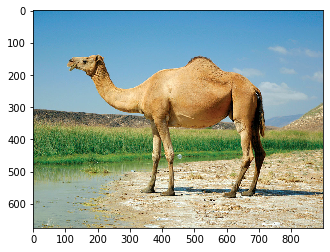

In [31]:
img_camel_RGB = cv2.cvtColor(img_camel_org, cv2.COLOR_BGR2RGB)
plt.imshow(img_camel_RGB)

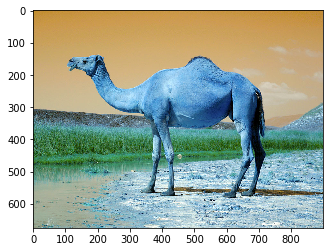

In [32]:
plt.imshow(img_camel_org)

In [33]:
img_sand_org = cv2.imread("desert.jpg")

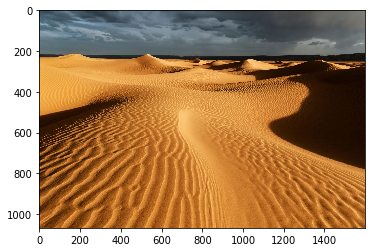

In [34]:
img_sand_RGB = cv2.cvtColor(img_sand_org, cv2.COLOR_BGR2RGB)
plt.imshow(img_sand_RGB)

0
Blended images by multiplying sand image to weight 1


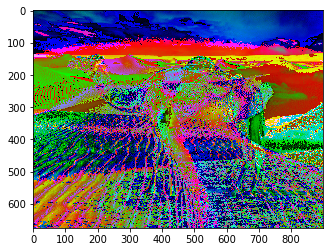

Subtracted camel from superimposed_img with weight 1


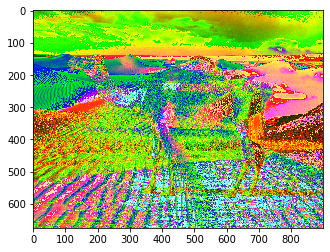

1
Blended images by multiplying sand image to weight 2


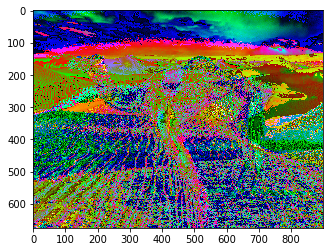

Subtracted camel from superimposed_img with weight 2


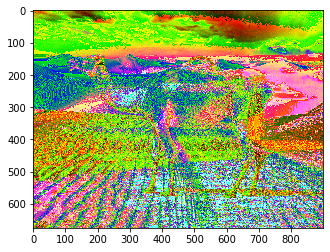

2
Blended images by multiplying sand image to weight 3


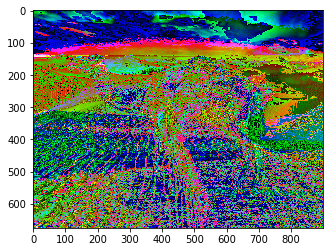

Subtracted camel from superimposed_img with weight 3


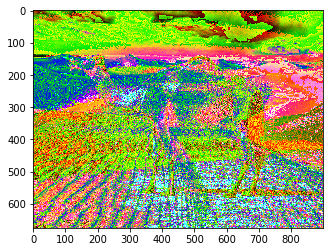

3
Blended images by multiplying sand image to weight 4


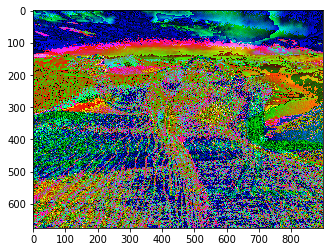

Subtracted camel from superimposed_img with weight 4


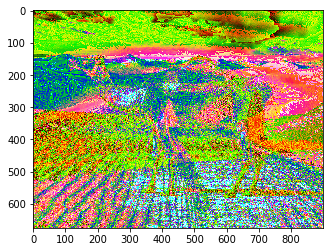

4
Blended images by multiplying sand image to weight 5


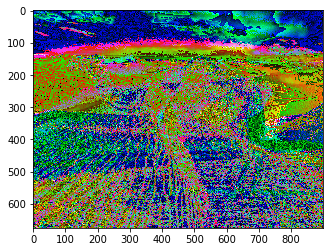

Subtracted camel from superimposed_img with weight 5


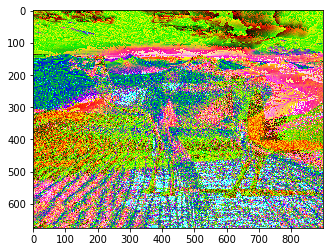

5
Blended images by multiplying sand image to weight 6


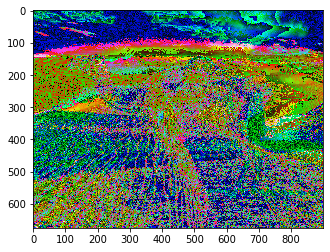

Subtracted camel from superimposed_img with weight 6


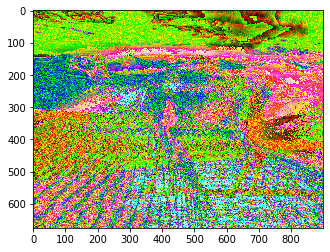

6
Blended images by multiplying sand image to weight 7


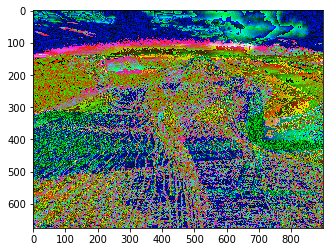

Subtracted camel from superimposed_img with weight 7


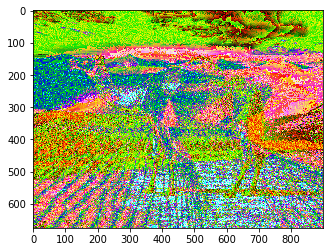

7
Blended images by multiplying sand image to weight 8


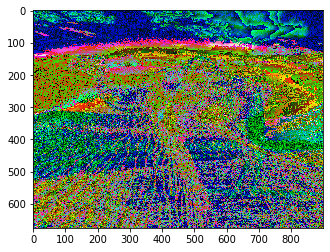

Subtracted camel from superimposed_img with weight 8


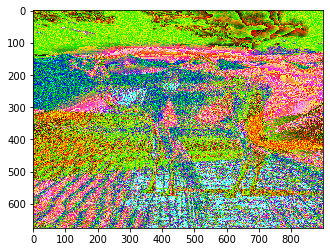

8
Blended images by multiplying sand image to weight 9


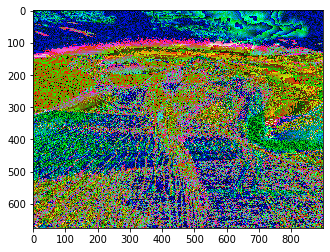

Subtracted camel from superimposed_img with weight 9


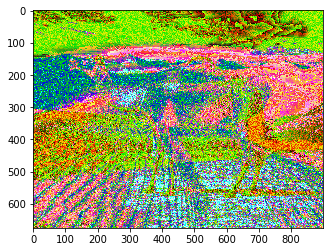

In [89]:
# We use cv2 to load the original image
img_came = img_camel_org
img_sand= cv2.resize(img_sand_org, (img_came.shape[1], img_came.shape[0]))

img_sand = cv2.applyColorMap(img_sand, cv2.COLORMAP_RAINBOW)
img_came = cv2.applyColorMap(img_came, cv2.COLORMAP_RAINBOW)

INTENSITY = [1, 2, 3, 4, 5, 6, 7, 8, 9] #range(0, 10, 2)

img = []
for i in range(len(INTENSITY)):
    print(i)
#     blend images
    superimposed_img = img_sand * INTENSITY[i] + img_came * INTENSITY[i] 
    superimposed_img = np.uint8(255 * superimposed_img)
    print('Blended images by multiplying sand image to weight', INTENSITY[i])
    superimposed_img_RGB = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)
    plt.imshow(superimposed_img)
    plt.show()
    img.append(superimposed_img)
    filename = "superimposed_img_camel_sand" + str(i) +'.jpg'
    cv2.imwrite(filename, superimposed_img_RGB)
    
#     subtract camel from the blended image
    subtract_img = superimposed_img - img_came
    subtract_img = np.uint8(255 * subtract_img)
    print('Subtracted camel from superimposed_img with weight', INTENSITY[i])
    subtracted_img_RGB = cv2.cvtColor(subtract_img, cv2.COLOR_BGR2RGB)
    plt.imshow(subtracted_img_RGB)
    plt.show()
    filename = "subtracted_img_RGB" + str(i) +'.jpg'
    cv2.imwrite(filename, subtracted_img_RGB)


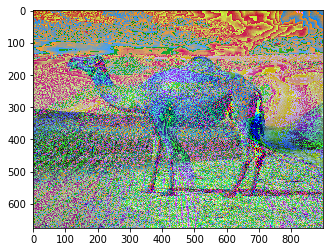

In [57]:
img_came = img_camel_org
img_sand = img_sand_org
INTENSITY1 = 8
INTENSITY2 = 1
img_sand = cv2.resize(img_sand, (img_came.shape[1], img_came.shape[0]))
img_sand = cv2.applyColorMap(np.uint8(255*img_sand), cv2.COLORMAP_JET)
superimposed_img = img_sand * INTENSITY1 + img_came *INTENSITY2
superimposed_img_RGB = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)
plt.imshow(superimposed_img)

In [58]:
img_came = img_camel_org
img_sand = img_sand_org
INTENSITY1 = 1
INTENSITY2 = 1
img_sand = cv2.resize(img_sand, (img_came.shape[1], img_came.shape[0]))
img_sand = cv2.applyColorMap(np.uint8(255*img_sand), cv2.COLORMAP_JET)
superimposed_img = img_sand * INTENSITY1 + img_came *INTENSITY2


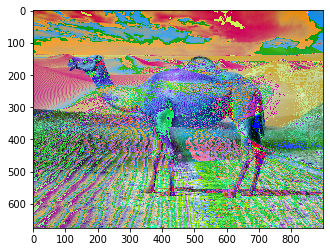

In [59]:
superimposed_img_RGB = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)
plt.imshow(superimposed_img)

In [106]:
filename = "superimposed_img_camel_san_RGB_natural.jpg"
cv2.imwrite(filename, superimposed_img_RGB)

True

True

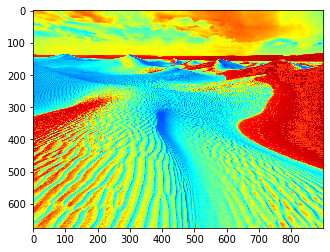

In [107]:
img_camel = img_camel_org
img_sand = img_sand_org
INTENSITY = 1
img_sand = cv2.resize(img_sand, (img_came.shape[1], img_came.shape[0]))
img_sand = cv2.applyColorMap(np.uint8(255*img_sand), cv2.COLORMAP_JET)
subtracted_img = superimposed_img * INTENSITY - img_came
subtracted_img_RGB = cv2.cvtColor(subtracted_img, cv2.COLOR_BGR2RGB)
plt.imshow(subtracted_img_RGB)
filename = "subtracted_img_camel_san_RGB_natural.jpg"
cv2.imwrite(filename, subtracted_img_RGB)


# Trimiming a downloaded  image from Google images to size 150x150 pixels using OpenCV 


In [41]:
from tensorflow.keras.models import load_model

model = load_model('cats_and_dogs_small_1.h5')
model.summary()  # As a reminder.

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 128)       1

In [46]:
from tensorflow.keras.preprocessing import image
import numpy as np

img_path = 'img1.jpg'
# trim it to size 150x150 pixels using OpenCV 
img = cv2.imread(img_path)
img = cv2.resize(img, (150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
print(type(img_tensor), img_tensor.size)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.
# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

<class 'numpy.ndarray'> 67500
(1, 150, 150, 3)


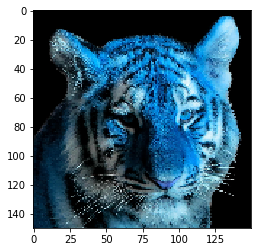

In [47]:
plt.imshow(img_tensor[0])
plt.show()

In [48]:
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.layers import Layer
from tensorflow.keras.models import Model

# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = Model(inputs=model.input, outputs=layer_outputs)

# Visualizing the channels with indexes 3 and 30 in the first convnet layer 

In [49]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

In [54]:
model.layers

In [51]:
first_layer_activation = activations[0]
print(first_layer_activation.shape)

(1, 148, 148, 32)


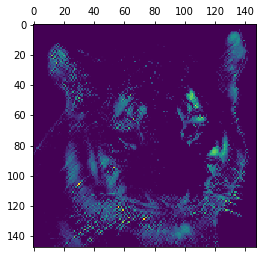

In [52]:
import matplotlib.pyplot as plt

plt.matshow(first_layer_activation[0, :, :, 3], cmap='viridis')
plt.show()

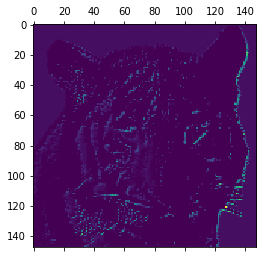

In [53]:
plt.matshow(first_layer_activation[0, :, :, 30], cmap='viridis')
plt.show()

# Visualize intermediate activations for convolutional layers and MaxPooling layer 

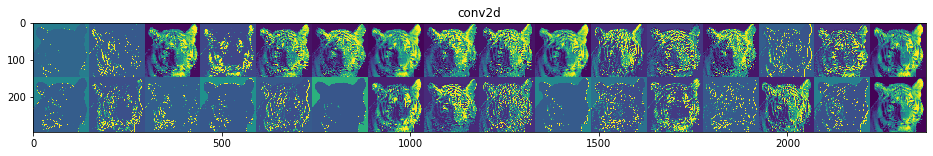

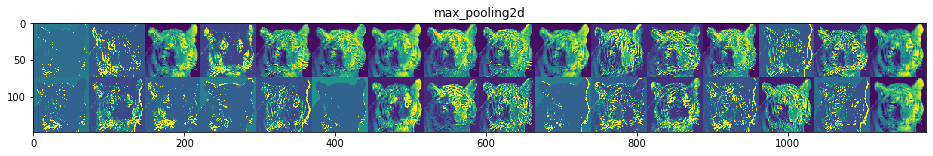

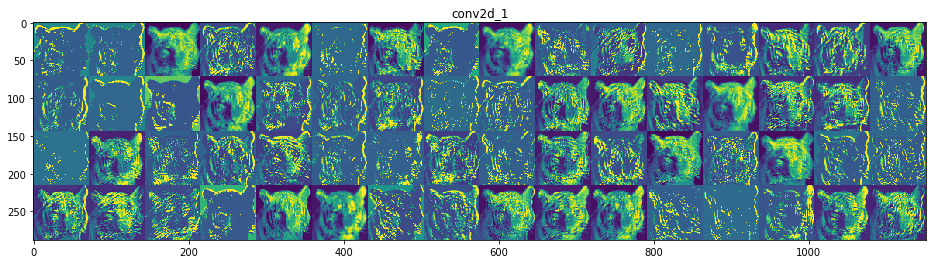

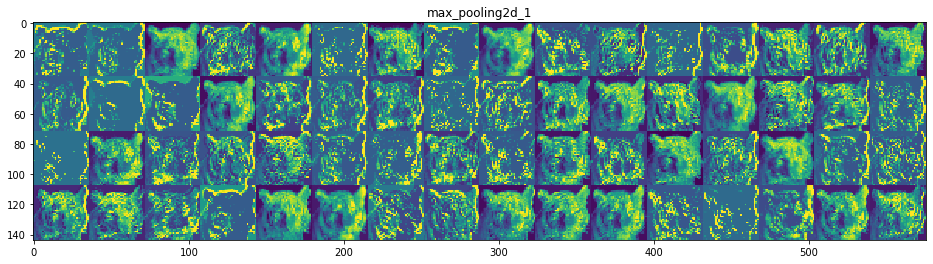

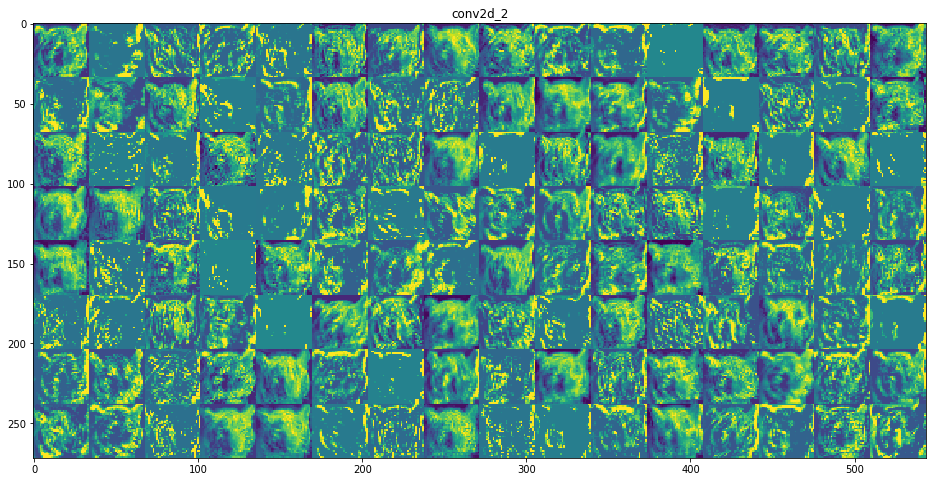

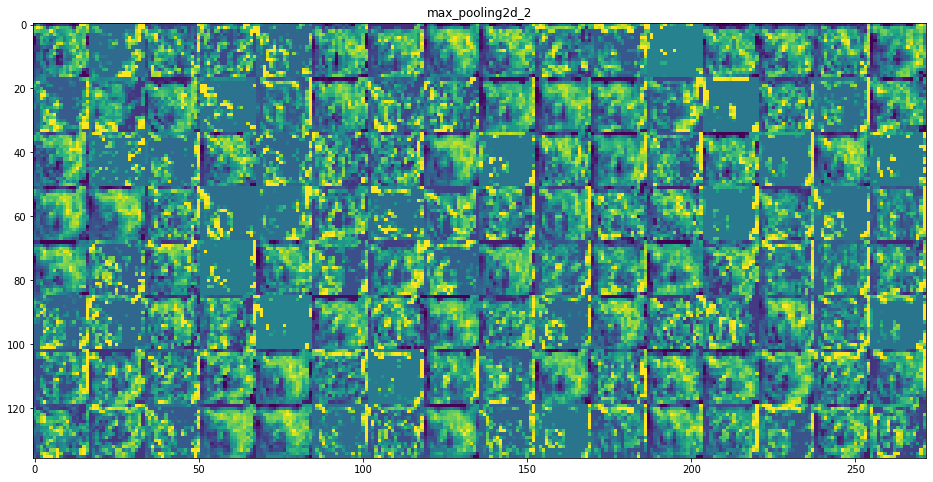

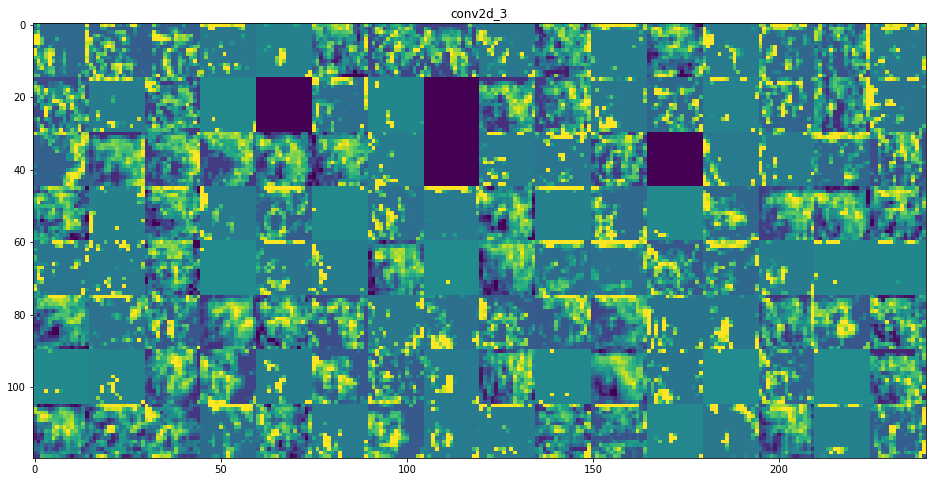

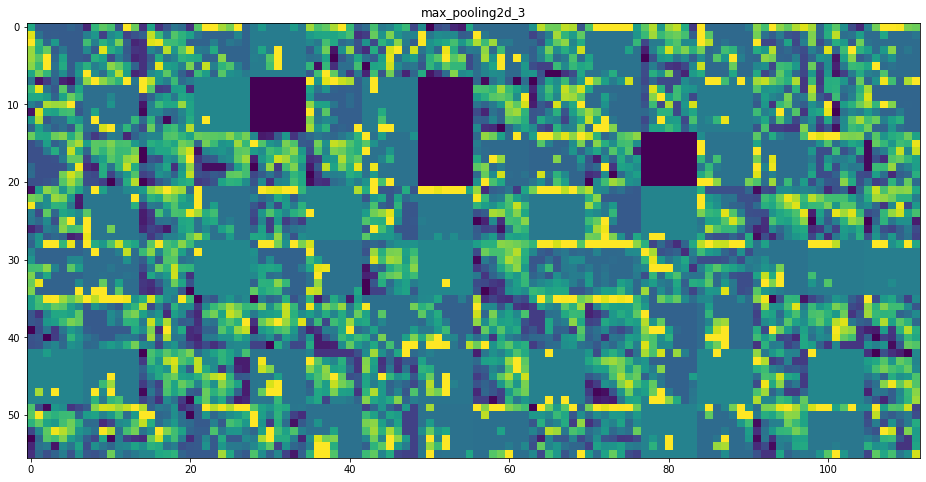

In [38]:
from tensorflow import keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

# Generate activation images
The dataset, CIFAR10, contains 60,000 images in 10 classes. Those classes are: airplanes, automobiles, birds,cats, deer, dogs, frogs, horses, ships and large trucks. CIFAR is an important data set with 80 million tiny images (32x32 pixels). CIFAR10 is a small subset of CIFAR. You can learn everything about CIFAR and CIFAR10 at 

- Comparing the level of detail we get now activationvisualized above for the img1. 
Note: Please notice that in both networks the image dimension ordering is set to 'tf' which corresponds to 'channel-last' ordering, or TensorFlow-style ordering. In some other Keras networks, you might see image dimension ordering set to 'th' which is the 'channel-first' ordering, or Theano-style ordering.
For example, a channel-first ordered 32x32 color image would have dimensions (3,32,32) in the 'th' ordering. In ‘tf’ ordering, the image would have dimensions (32,32,3). At the beginning of both networks you have statements: K.set_image_dim_ordering('tf’). You do not have to change it since you are using TensorFlow backend. In the model definition of the first Conv2D layer, the input_shape of the incoming images are already set to channel-last order: input_shape=(32,32,3). Again, you do not have to change anything. This is just to warn you that the parameter input_shape could have different format.

# Using TensorFlow 2.x.

In [39]:
import tensorflow as tf
from tensorflow import keras

In [40]:
from matplotlib import pyplot
from PIL import Image

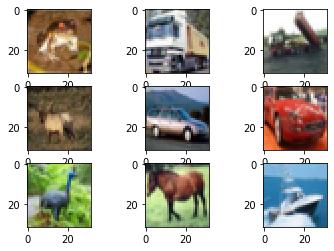

In [41]:
#from scipy.misc import toimage
%matplotlib inline
cifar10 = tf.keras.datasets.cifar10
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
for i in range(0, 9):
	pyplot.subplot(330 + 1 + i)
	pyplot.imshow(Image.fromarray(X_train[i]))
# show the plot

pyplot.show()

In [42]:
import numpy

In [43]:
from tensorflow.keras.datasets import cifar10
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten

In [44]:
from tensorflow.keras.constraints import MaxNorm
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.utils import to_categorical

In [45]:
K = tf.keras.backend
seed = 7
# load data
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
# normalize inputs from 0-255 to 0.0-1.0
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train = X_train / 255.0
X_test = X_test / 255.0
# one hot encode outputs
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
num_classes = y_test.shape[1]


In [42]:
model = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3, 3), input_shape=(32, 32,3), padding='same', activation='relu', kernel_constraint=MaxNorm(3)),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_constraint=MaxNorm(3)),
  tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dense(512, activation='relu', kernel_constraint=MaxNorm(3)),
  tf.keras.layers.Dropout(0.5),
  tf.keras.layers.Dense(num_classes, activation='softmax')
])

In [43]:
epochs = 25
lrate = 0.01
decay = lrate/epochs
sgd = SGD(lr=lrate, momentum=0.9, decay=decay, nesterov=False)
model.compile(optimizer=sgd,
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])

print(model.summary())

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 32, 32, 32)        896       
_________________________________________________________________
dropout (Dropout)            (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 16, 16, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 8192)              0         
_________________________________________________________________
dense (Dense)                (None, 512)               4194816   
_________________________________________________________________
dropout_1 (Dropout)          (None, 512)               0

In [44]:
# Fit the model
history = model.fit(X_train,
                    y_train,
                    epochs=epochs,
                    batch_size=32,
                    validation_data=(X_test, y_test))



Train on 50000 samples, validate on 10000 samples
Epoch 1/25
50000/50000 [==============================] - 141s 3ms/sample - loss: 1.7020 - accuracy: 0.3835 - val_loss: 1.3484 - val_accuracy: 0.5127
Epoch 2/25
50000/50000 [==============================] - 139s 3ms/sample - loss: 1.3116 - accuracy: 0.5304 - val_loss: 1.1503 - val_accuracy: 0.5910
Epoch 3/25
50000/50000 [==============================] - 140s 3ms/sample - loss: 1.1357 - accuracy: 0.5936 - val_loss: 1.0545 - val_accuracy: 0.6249
Epoch 4/25
50000/50000 [==============================] - 135s 3ms/sample - loss: 1.0114 - accuracy: 0.6438 - val_loss: 1.0032 - val_accuracy: 0.6427
Epoch 5/25
50000/50000 [==============================] - 135s 3ms/sample - loss: 0.9181 - accuracy: 0.6779 - val_loss: 0.9556 - val_accuracy: 0.6623
Epoch 6/25
50000/50000 [==============================] - 137s 3ms/sample - loss: 0.8348 - accuracy: 0.7045 - val_loss: 0.9582 - val_accuracy: 0.6620
Epoch 7/25
50000/50000 [==========================

In [45]:
scores = model.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))

Accuracy: 70.84%


# A second, deeper, network 

In [46]:
K = tf.keras.backend
seed = 7
# load data
(X_train, y_train), (X_test, y_test) = cifar10.load_data()
# normalize inputs from 0-255 to 0.0-1.0
X_train = X_train.astype('float32')
X_test = X_test.astype('float32')
X_train = X_train / 255.0
X_test = X_test / 255.0
# one hot encode outputs
y_train = to_categorical(y_train)
y_test = to_categorical(y_test)
num_classes = y_test.shape[1]


In [47]:
model_large = tf.keras.models.Sequential([
  tf.keras.layers.Conv2D(32, (3, 3), input_shape=(32, 32, 3), activation='relu', padding='same'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
  tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
  tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
  tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
  tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
  tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
  tf.keras.layers.Flatten(),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1024, activation='relu', kernel_constraint=MaxNorm(3)),
  tf.keras.layers.Dropout(0.2),   
  tf.keras.layers.Dense(512, activation='relu', kernel_constraint=MaxNorm(3)),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(num_classes, activation='softmax')
])


In [48]:
epochs = 25
lrate = 0.01
decay = lrate/epochs
sgd = SGD(lr=lrate, momentum=0.9, decay=decay, nesterov=False)
model_large.compile(optimizer=sgd,
              loss=tf.keras.losses.CategoricalCrossentropy(),
              metrics=['accuracy'])

print(model_large.summary())

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 64)        18496     
_________________________________________________________________
dropout_3 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 16, 16, 64)       

In [49]:
# Fit the model
history_large = model_large.fit(X_train,
                    y_train,
                    epochs=epochs,
                    batch_size=64,
                    validation_data=(X_test, y_test))


scores_large = model_large.evaluate(X_test, y_test, verbose=0)
print("Accuracy: %.2f%%" % (scores[1]*100))


Train on 50000 samples, validate on 10000 samples
Epoch 1/25
50000/50000 [==============================] - 162s 3ms/sample - loss: 1.9520 - accuracy: 0.2792 - val_loss: 1.6441 - val_accuracy: 0.4010
Epoch 2/25
50000/50000 [==============================] - 167s 3ms/sample - loss: 1.5281 - accuracy: 0.4441 - val_loss: 1.4489 - val_accuracy: 0.4763
Epoch 3/25
50000/50000 [==============================] - 163s 3ms/sample - loss: 1.3564 - accuracy: 0.5099 - val_loss: 1.3135 - val_accuracy: 0.5233
Epoch 4/25
50000/50000 [==============================] - 166s 3ms/sample - loss: 1.2298 - accuracy: 0.5579 - val_loss: 1.1775 - val_accuracy: 0.5699
Epoch 5/25
50000/50000 [==============================] - 161s 3ms/sample - loss: 1.1342 - accuracy: 0.5914 - val_loss: 1.1298 - val_accuracy: 0.5978
Epoch 6/25
50000/50000 [==============================] - 170s 3ms/sample - loss: 1.0465 - accuracy: 0.6263 - val_loss: 1.0234 - val_accuracy: 0.6386
Epoch 7/25
50000/50000 [==========================

In [50]:
model_large.save('model_large.h5')

# Generating activation images like the ones generated for the "img1" from a Truck image:

In [58]:
from tensorflow.keras.models import load_model

model = load_model('model_large.h5')
model.summary()  

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 64)        18496     
_________________________________________________________________
dropout_3 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 16, 16, 64)       

In [67]:
img = cv2.imread("large_truck_3.jpg")
# trim the image to 32x32 pixels using OpenCV 
img = cv2.resize(img, (32, 32))

In [68]:
print(type(img), img.size)
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
print(type(img_tensor), img_tensor.size)
# Remember that the model was trained on inputs
# that were preprocessed in the following way:
img_tensor /= 255.

# Its shape is (1, 150, 150, 3)
print(img_tensor.shape)

<class 'numpy.ndarray'> 3072
<class 'numpy.ndarray'> 3072
(1, 32, 32, 3)


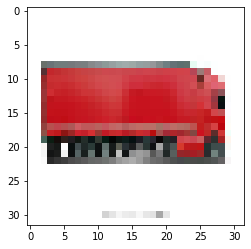

In [72]:
img_RGB = cv2.cvtColor(img_tensor[0], cv2.COLOR_BGR2RGB)
plt.imshow(img_RGB)

# plt.imshow(img_tensor[0])
# plt.show()

In [62]:
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras.layers import Layer
from tensorflow.keras.models import Model

# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = Model(inputs = model.input, outputs=layer_outputs)

In [63]:
# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)

# Visualize intermediate activations for convolutional layers and MaxPooling layer

In [64]:
model.layers

//anaconda3/envs/DL2020/lib/python3.7/site-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide


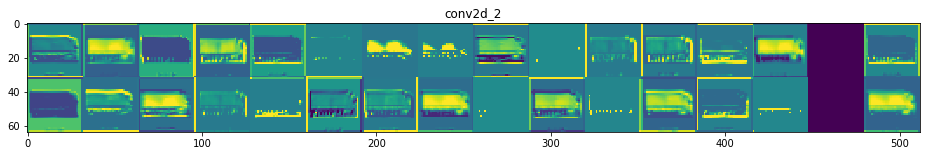

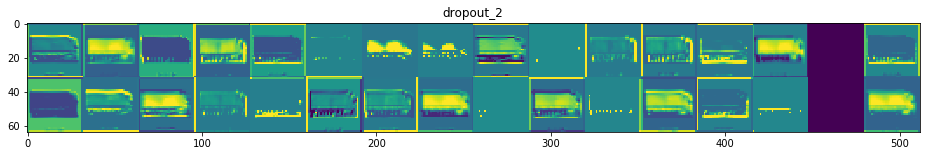

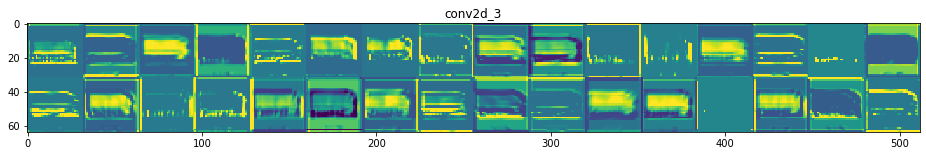

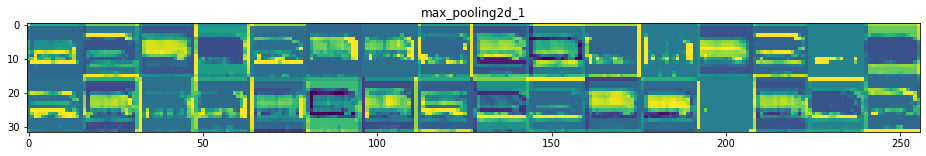

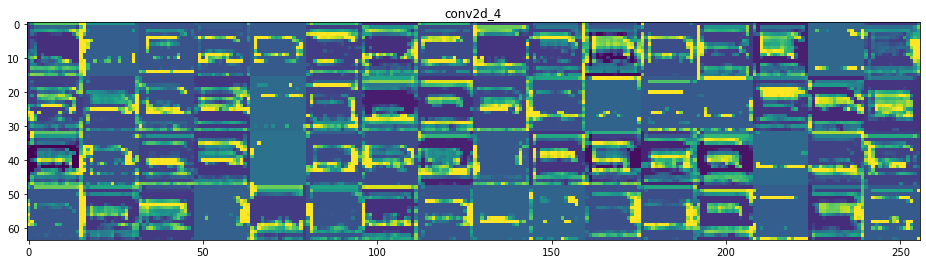

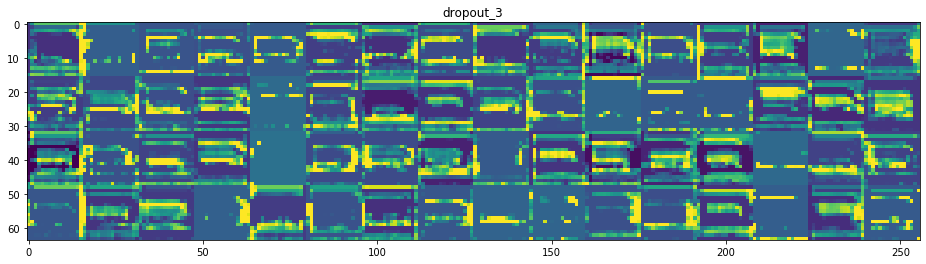

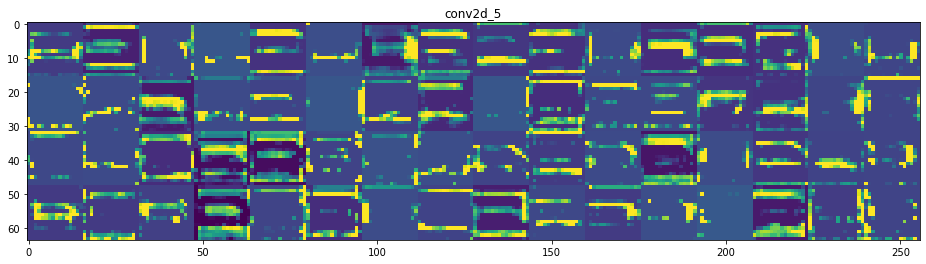

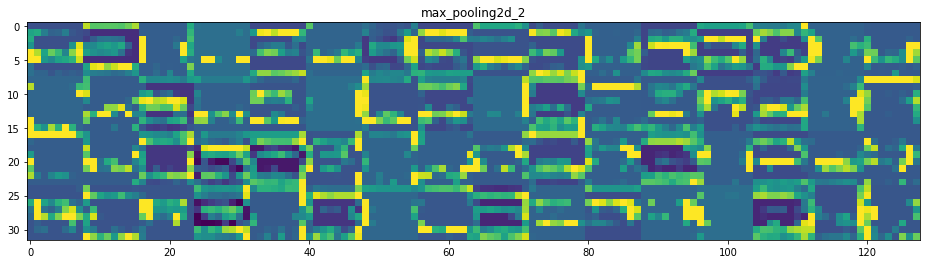

In [65]:
import matplotlib.pyplot as plt
from tensorflow import keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:12]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()

### Comparing the level of detail in filters from problem 3 model on truck with whate we got in Problem 2:

The feature maps of Problem 2 are more detailed and visually interpretable particularly in the earlier layers. Filters of problem 3 has  do not have as detail, and are more abstract and represent the classes.

# Which filters are getting more excited? ;D


In [54]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import backend as K
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [55]:
model = tf.keras.models.load_model('model_large.h5')
#remove the dense layers
model.pop() 
model.pop() 
model.pop() 
model.pop() 
model.pop() 
model.pop() 
model.pop()
#get the model summary
model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 64)        18496     
_________________________________________________________________
dropout_3 (Dropout)          (None, 16, 16, 64)        0         
_______________________________________

In [56]:
layer_name = 'conv2d_2'
filter_index = 0
layer_output = model.get_layer(layer_name).output

In [57]:
layer_output[:,:,:,0]

<tf.Tensor 'strided_slice:0' shape=(None, 32, 32) dtype=float32>

In [58]:
loss = K.mean(layer_output[:, :, :, filter_index])

In [59]:
# The call to `gradients` returns a list of tensors (of size 1 in this case)
# hence we only keep the first element -- which is a tensor.
# from tensorflow.python.framework.ops import disable_eager_execution
# disable_eager_execution()

grads = K.gradients(loss, model.input)[0]
# We add 1e-5 before dividing so as to avoid accidentally dividing by 0.
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [61]:
print(type(grads), grads.shape)

<class 'tensorflow.python.framework.ops.Tensor'> (None, 32, 32, 3)


In [62]:
iterate = K.function([model.input], [loss, grads])

# Let's test it:
import numpy as np
loss_value, grads_value = iterate([np.zeros((1, 150, 150, 3))])

In [63]:
# We start from a gray image with some noise
input_img_data = np.random.random((1, 150, 150, 3)) * 20 + 128.

# Run gradient ascent for 40 steps
step = 1.  # this is the magnitude of each gradient update
for i in range(40):
    # Compute the loss value and gradient value
    loss_value, grads_value = iterate([input_img_data])
    # Here we adjust the input image in the direction that maximizes the loss
    input_img_data += grads_value * step

In [64]:
def deprocess_image(x):
    # normalize tensor: center on 0., ensure std is 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # clip to [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # convert to RGB array
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [65]:
def generate_pattern(layer_name, filter_index, size=150):
    # Build a loss function that maximizes the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    loss = K.mean(layer_output[:, :, :, filter_index])

    # Compute the gradient of the input picture wrt this loss
    grads = K.gradients(loss, model.input)[0]

    # Normalization trick: we normalize the gradient
    grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

    # This function returns the loss and grads given the input picture
    iterate = K.function([model.input], [loss, grads])
    
    # We start from a gray image with some noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    # Run gradient ascent for 40 steps
    step = 1.
    for i in range(40):
        loss_value, grads_value = iterate([input_img_data])
        input_img_data += grads_value * step
        
    img = input_img_data[0]
    return deprocess_image(img)

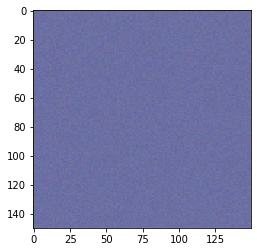

In [135]:
plt.imshow(generate_pattern('conv2d_2',23))
plt.show()

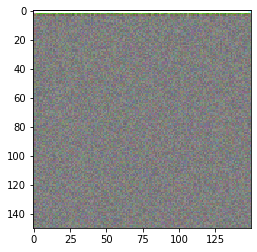

In [66]:
plt.imshow(generate_pattern('conv2d_3', 0))
plt.show()

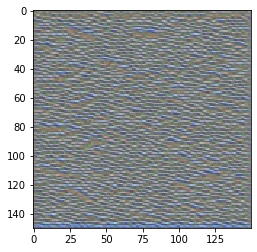

In [67]:
plt.imshow(generate_pattern('conv2d_4', 5))
plt.show()

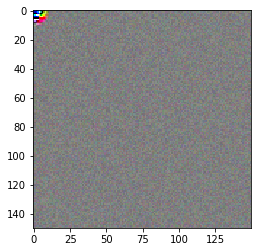

In [72]:
plt.imshow(generate_pattern('conv2d_5', 5))
plt.show()

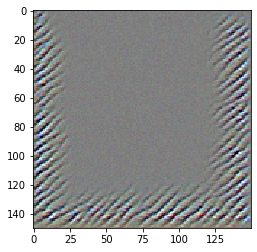

In [70]:
plt.imshow(generate_pattern('conv2d_6', 66))
plt.show()

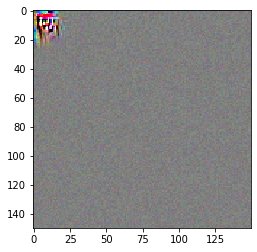

In [73]:
plt.imshow(generate_pattern('conv2d_7', 50))
plt.show()

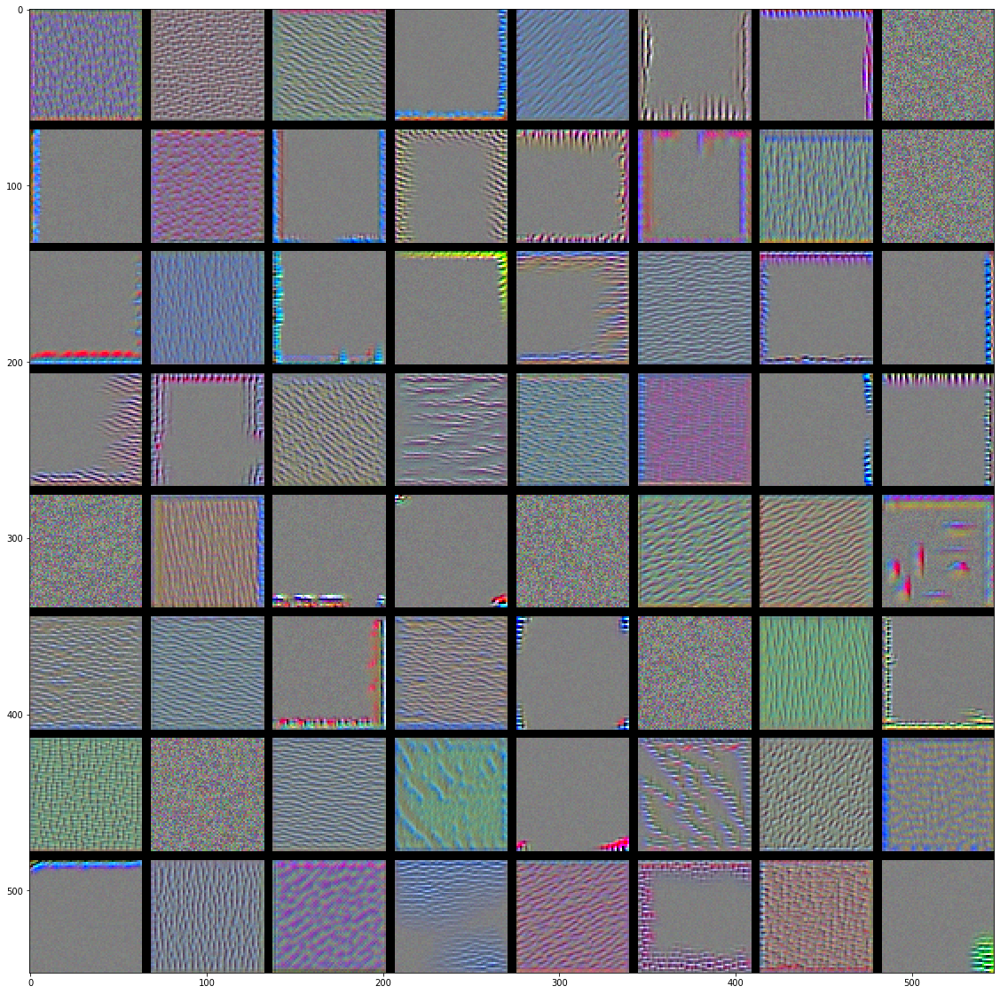

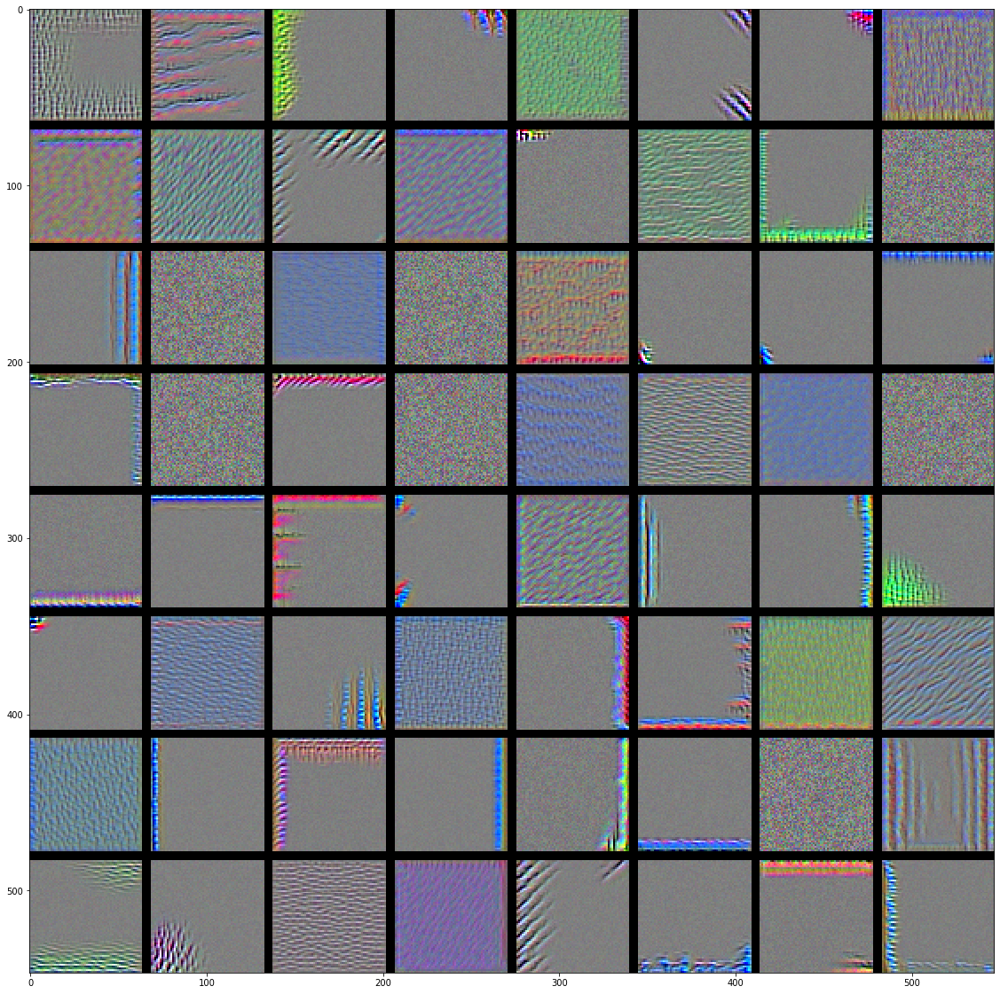

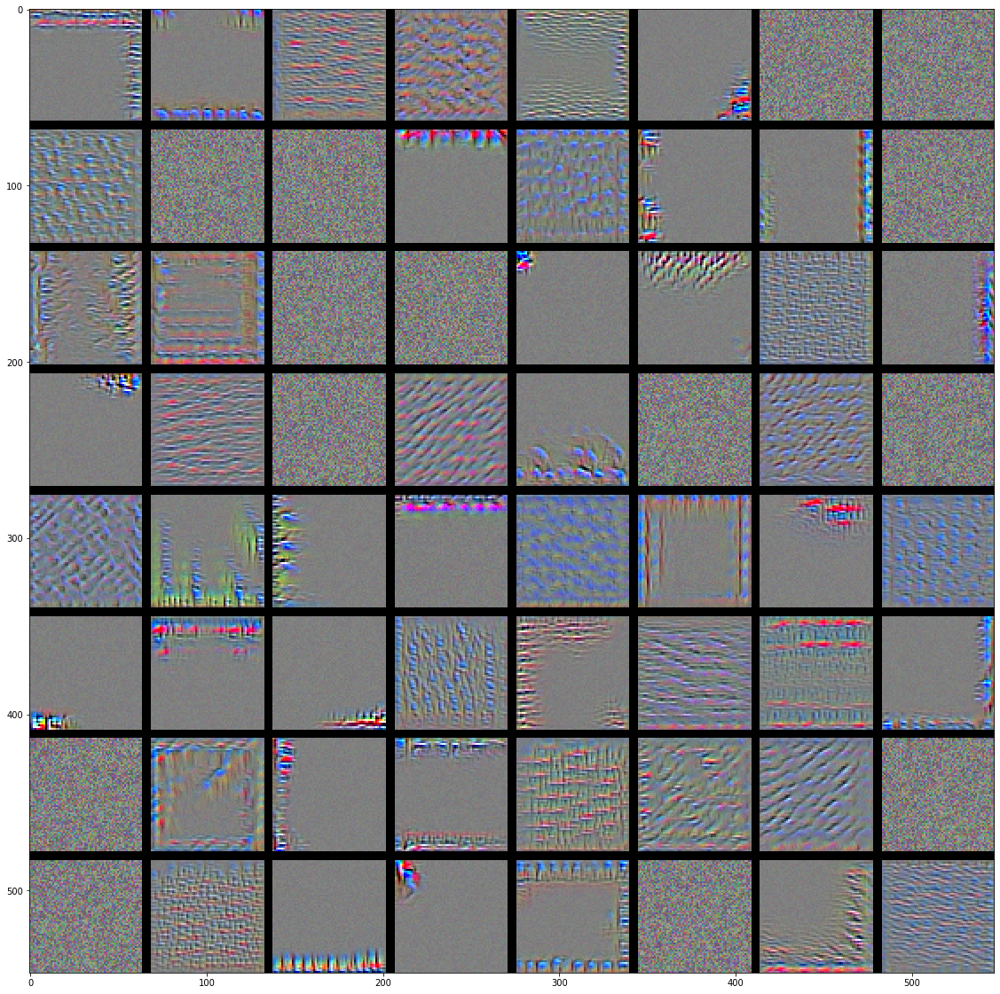

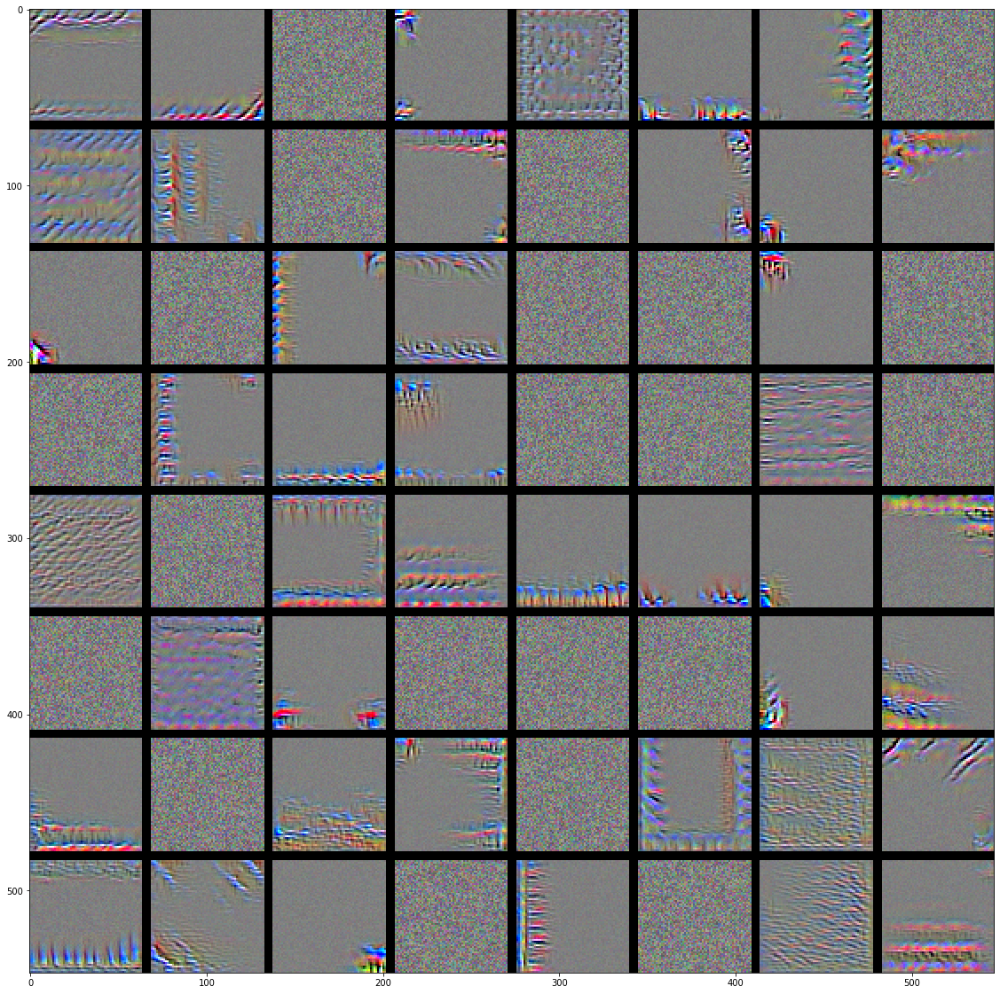

In [144]:
for layer_name in ['conv2d_4', 'conv2d_5', 'conv2d_6', 'conv2d_7']:
    size = 64
    margin = 5

    # This a empty (black) image where we will store our results.
    results = np.zeros((8 * size + 7 * margin, 8 * size + 7 * margin, 3))

    for i in range(8):  # iterate over the rows of our results grid
        for j in range(8):  # iterate over the columns of our results grid
            # Generate the pattern for filter `i + (j * 8)` in `layer_name`
            filter_img = generate_pattern(layer_name, i + (j * 8), size=size)

            # Put the result in the square `(i, j)` of the results grid
            horizontal_start = i * size + i * margin
            horizontal_end = horizontal_start + size
            vertical_start = j * size + j * margin
            vertical_end = vertical_start + size
            results[horizontal_start: horizontal_end, vertical_start: vertical_end, :] = filter_img
            results = results.astype('int')
    # Display the results grid
    plt.figure(figsize=(20, 20))
    plt.imshow(results)
    plt.show()


# Testing the generation of the heatmap


# heatmap using a pre-trained VGG16 model:

In [130]:
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras import backend as K
import matplotlib.pyplot as plt
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


K.clear_session()

# Note that we are including the densely-connected classifier on top;
# all previous times, we were discarding it.
model = VGG16(weights='imagenet')
model.summary()

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
______________________________________________

In [131]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np

# The local path to our target image
img_path = 'bird.jpg'

# `img` is a PIL image of size 224x224
img = image.load_img(img_path, target_size=(224, 224))

# `x` is a float32 Numpy array of shape (224, 224, 3)
x = image.img_to_array(img)

# We add a dimension to transform our array into a "batch"
# of size (1, 224, 224, 3)
x = np.expand_dims(x, axis=0)

# Finally we preprocess the batch
# (this does channel-wise color normalization)
x = preprocess_input(x)

In [132]:
preds = model.predict(x)
print('Predicted:', decode_predictions(preds, top=3)[0])

Predicted: [('n01820546', 'lorikeet', 0.3900394), ('n01818515', 'macaw', 0.30158055), ('n01833805', 'hummingbird', 0.07276406)]


In [133]:
np.argmax(preds[0])

90

# VGG16 predicts that this bird image is a lorikeet type and it is ahown in class number 90

In [134]:
# This is the "lorikeet" entry in the prediction vector
bird_output = model.output[:, 90]

# The is the output feature map of the `block5_conv3` layer,
# the last convolutional layer in VGG16
last_conv_layer = model.get_layer('block5_conv3')

# This is the gradient of the "lorikeet" class with regard to
# the output feature map of `block5_conv3`
grads = K.gradients(bird_output, last_conv_layer.output)[0]

# This is a vector of shape (512,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# `pooled_grads` and the output feature map of `block5_conv3`,
# given a sample image
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of two birds
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array
# by "how important this channel is" with regard to the bird class
for i in range(512):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map
# is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis=-1)

In [135]:
heatmap

array([[ 3.25559517e-06,  3.09041502e-06,  3.40032193e-06,
         2.84931502e-06,  2.62976369e-06,  2.85620035e-06,
         3.06056495e-06,  2.61956166e-06,  2.36070400e-06,
         2.02722526e-06,  1.69406439e-06,  1.27418900e-06,
         1.70977970e-07,  4.87420891e-07],
       [ 3.09008055e-06,  2.18243122e-06,  3.43414740e-06,
         2.82232213e-06,  1.77967286e-06,  1.21753703e-06,
         1.20078687e-06,  1.34092545e-06,  1.46461571e-06,
         1.66756718e-06,  9.12929977e-07,  8.23261530e-07,
         5.86047918e-07,  6.89237083e-07],
       [ 4.59069543e-06,  4.65741959e-06,  5.94449466e-06,
         2.97092856e-06,  1.62715946e-06,  1.31276852e-06,
         1.71066347e-06,  1.92598145e-06,  1.28834529e-06,
         1.17378897e-06,  6.54620692e-07,  3.04395115e-07,
         8.16158263e-07,  1.33341973e-06],
       [ 5.98394581e-06,  5.78870004e-06,  4.67979135e-06,
         4.35140873e-06,  1.35389055e-05,  1.69145424e-05,
         1.08956465e-05,  7.39940333e-07,  1.

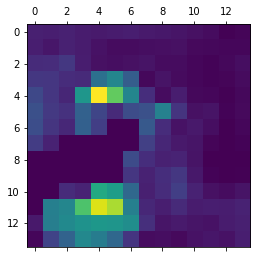

In [136]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [140]:
import cv2

# We use cv2 to load the original image
img = cv2.imread(img_path)

# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# We convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
superimposed_img = heatmap * 0.4 + img

# Save the image to disk
cv2.imwrite('bird_heatmap_vgg16.jpg', superimposed_img)


True

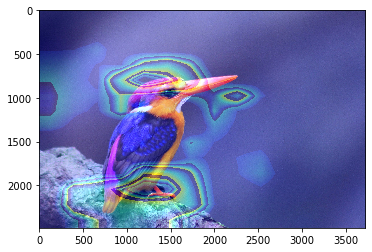

In [141]:
image_bird = cv2.imread("bird_heatmap_vgg16.jpg")
image_bird = cv2.cvtColor(image_bird, cv2.COLOR_BGR2RGB)
plt.imshow(image_bird)

# heatmap using network trained in Problem 3. 
Using the same bird image and generate a heat map with CIFAR10 trained network:

In [14]:
from tensorflow.keras.models import load_model
model = load_model('model_large.h5')
model.summary() 

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_2 (Conv2D)            (None, 32, 32, 32)        896       
_________________________________________________________________
dropout_2 (Dropout)          (None, 32, 32, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 32, 32, 32)        9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 16, 16, 64)        18496     
_________________________________________________________________
dropout_3 (Dropout)          (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 16, 16, 64)       

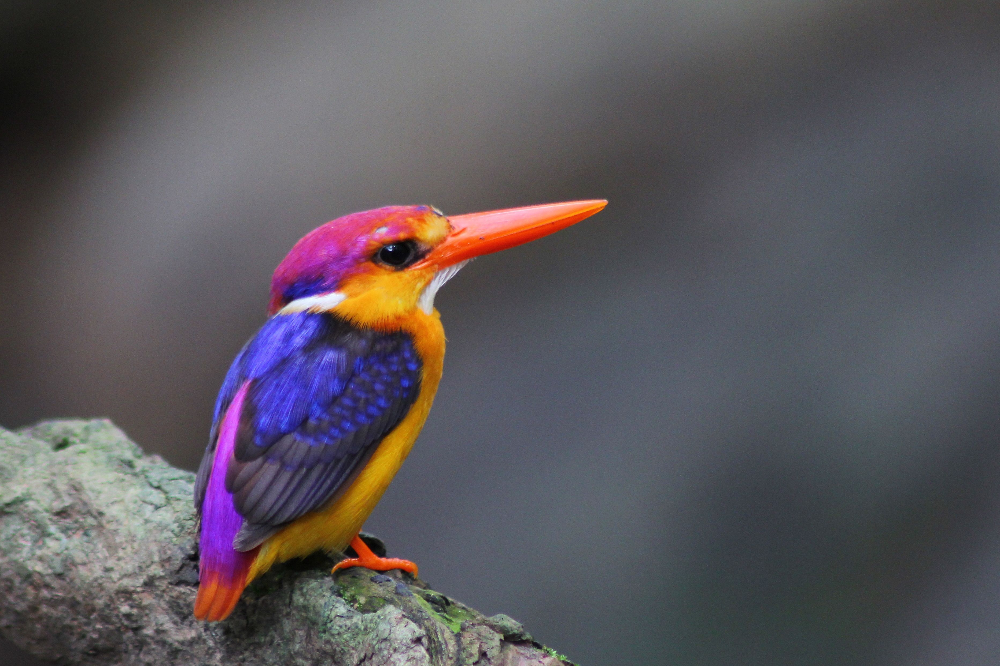

In [15]:
Image(filename='bird.jpg')

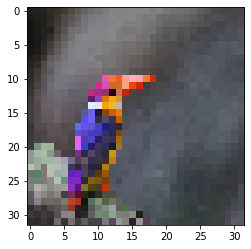

In [16]:
ORIGINAL = 'bird.jpg'
DIM = 32
img = image.load_img(ORIGINAL, target_size=(DIM, DIM))
plt.imshow(img)
plt.show()

In [17]:
x = image.img_to_array(img)
x = np.expand_dims(x, axis=0)
x = preprocess_input(x)

preds = model.predict(x)

In [18]:
# np.argmax(model_out[0])
preds

array([[1.17201380e-01, 3.00457478e-02, 8.32470596e-01, 1.06607295e-04,
        8.18219414e-05, 2.50765850e-04, 1.81461424e-02, 1.26300220e-04,
        5.92646356e-05, 1.51141407e-03]], dtype=float32)

In [26]:
np.argmax(model_out[0])

2

# Pretrained model from problem 3 (model_large) predicts that this image is a 'bird' and it is shown in class with index 2, (which is the 3rd class)

1) Compute the model output and last convolutional layer output for the image.
2) Find the index of the winning class in the model output.
3) Compute the gradient of the winning class with resepct to the last convolutional layer.
3) Average this, then weigh it with the last convolutional layer (multiply them).
4) Normalize between 0 and 1 for visualization
5) Convert to RGB and layer it over the original image.

In [19]:
# Make sure to restart Kernel if you are using hard coded names  
with tf.GradientTape() as tape:
  last_conv_layer = model.get_layer('conv2d_7')
  print(last_conv_layer.trainable_variables)
  
  iterate = tf.keras.models.Model([model.inputs], [model.output, last_conv_layer.output])
  model_out, last_conv_layer = iterate(x)
  class_out = model_out[:, np.argmax(model_out[0])]
  print(last_conv_layer.shape)
    
  grads = tape.gradient(class_out, last_conv_layer)
  pooled_grads = K.mean(grads, axis=(0, 1, 2))
  print(pooled_grads.shape)

heatmap = tf.reduce_mean(tf.multiply(pooled_grads, last_conv_layer), axis=-1)

[<tf.Variable 'conv2d_7_1/kernel:0' shape=(3, 3, 128, 128) dtype=float32, numpy=
array([[[[-0.03894485,  0.01414301, -0.02747164, ..., -0.04152828,
          -0.02630868, -0.03879637],
         [ 0.00982922,  0.05554766,  0.02892249, ...,  0.00563097,
           0.01238936, -0.02079823],
         [-0.03652097, -0.02740004,  0.00104048, ..., -0.00191598,
          -0.05211533,  0.01944854],
         ...,
         [-0.04915264, -0.02817802,  0.0061829 , ...,  0.03250358,
          -0.03553632, -0.00295589],
         [-0.05011028, -0.01632833, -0.00280776, ...,  0.06411295,
           0.01214492, -0.03961145],
         [-0.00087893, -0.03625552,  0.01529036, ..., -0.04009546,
          -0.03083243, -0.04431411]],

        [[-0.04424401, -0.04981362,  0.01013081, ..., -0.0484404 ,
           0.07794508,  0.01296766],
         [-0.03330059, -0.03474483,  0.01814793, ..., -0.01241986,
          -0.04225482,  0.00442052],
         [-0.03448214, -0.02347216,  0.01186551, ...,  0.02153477,
    

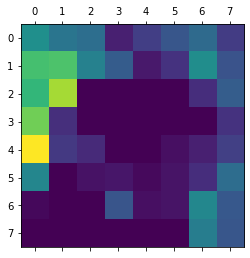

In [22]:
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
heatmap = heatmap.reshape((8, 8))
plt.matshow(heatmap)
plt.show()

In [23]:
img = cv2.imread(ORIGINAL)
INTENSITY = 1
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
heatmap = cv2.applyColorMap(np.uint8(255*heatmap), cv2.COLORMAP_JET)
superimposed_img = heatmap * INTENSITY + img
cv2.imwrite('bird_heatmap_largemodel.jpg', superimposed_img)

True

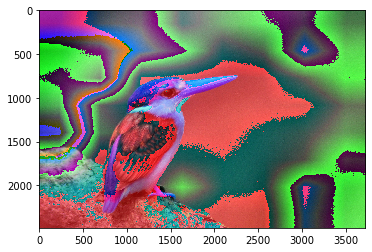

In [24]:
plt.imshow(superimposed_img)
plt.show()


- The heatmap created on the on the super imposed image from VGG16 model highlights a specigic region on the image whereas the heatmap from the model in problem 3 (model_large) highlights many regions with greater radius.

- The VGG16 model includes many classes associated to bird types. Therfore in includes filters that are specifically learned for each of those bird types.

- The model in problem 3 with cifar10 created a heatmap on the super imposed image highlighting large regions with filters representing "bird" as a whole category.  therefore the filters are more generic compareg to VGG16.